In [9]:
from availability_estimation import grade_territory
import momepy
import osmnx as ox
import pandas as pd
import graphbuilder_v2
import geopandas as gpd
from pyproj import Transformer
import matplotlib.pyplot as plt
import folium


In [2]:
lo_polygon = ox.geocode_to_gdf('R176095', by_osmid=True).to_crs(epsg=32636)
graph = graphbuilder_v2.get_graph_from_polygon(lo_polygon, crs=32636)
graph = graphbuilder_v2.convert_geometry_from_wkt(graph)

stops = gpd.read_file('lo_gdfs/ЖД остановки.geojson')

/Users/polina/Desktop/github/transport_frames/.venv/lib/python3.10/site-packages/osmnx/_overpass.py:254: UserWarning: This area is 52 times your configured Overpass max query area size. It will automatically be divided up into multiple sub-queries accordingly. This may take a long time.
  multi_poly_proj = utils_geo._consolidate_subdivide_geometry(poly_proj)
/Users/polina/Desktop/github/transport_frames/Polina/graphbuilder_v2.py:197: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  edges = edges.explode()
2024-05-19 18:48:33.614 | INFO     | graphbuilder_v2:convert_geometry_from_wkt:32 - The graph was converted!


## Оценка ГП СП

In [5]:
polygons188 = gpd.read_file('lo_gdfs/polygons188.geojson')

In [12]:
a = grade_territory(polygons188, graph, stops)

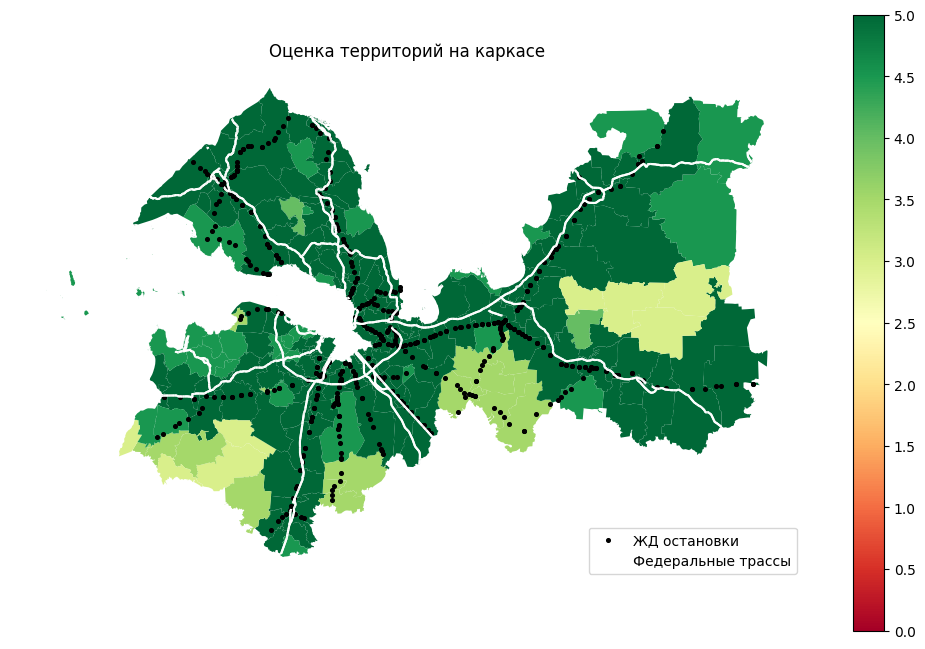

In [28]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Create a figure and axis
fig, ax = plt.subplots(1, 1, figsize=(16, 8))

# Plot polygons with 'grade' column using reversed 'RdYlGn_r' colormap
a.plot(column='grade', cmap=plt.get_cmap('RdYlGn_r').reversed(), ax=ax, vmin=0, legend=True, markersize=4).set_axis_off()

# Plot railway stops with legend
stops.to_crs(a.crs).plot(ax=ax, markersize=7, color='black', label='ЖД остановки').set_axis_off()

# # Plot edges with 'reg' column equal to 1 and add legend
nodes, edges = momepy.nx_to_gdf(graph, points=True, lines=True, spatial_weights=False)
edges[edges['reg'] == 1].plot(ax=ax, color='white', label='Федеральные трассы')

# Add colorbar with custom ticks
colorbar = plt.colorbar(cm.ScalarMappable(cmap=plt.get_cmap('RdYlGn_r').reversed(), norm=plt.Normalize(vmin=0, vmax=5)), ax=ax)
colorbar.set_ticks(np.arange(0, 5.1, 0.5))

# Add legend
ax.legend(loc='lower right')
# Remove the second colorbar
fig.delaxes(fig.axes[1])
# Set title
plt.title('Оценка территорий на каркасе')
# plt.savefig('estimation.png', dpi=600)
# Show plot
plt.show()


## Оценка территорий неудобий

In [17]:
p1 = gpd.read_file('lo_gdfs/Аэродром лодейнопольское поселение.geojson')
p2 = gpd.read_file('lo_gdfs//Аэродром Сиверск .geojson')
p3 = gpd.read_file('lo_gdfs//project Светогорского поселения.geojson')
p4 = gpd.read_file('lo_gdfs//project Шлиссельбург.geojson')

In [18]:
neudobiya = pd.concat([p1,p2,p3,p4])
n_grade = grade_territory(neudobiya, graph, stops)

In [19]:
# Initialize the map
m = folium.Map()
gdf = n_grade.copy()
# Add polygons and their buffers to the map
gdf['buffer'] = gdf['geometry'].buffer(5000)
gdf = gdf.set_geometry('buffer').to_crs(4326)
gdf = gdf.set_geometry('geometry').to_crs(4326)

for _, row in gdf.to_crs(4326).iterrows():
    # Add the polygon to the map
    folium.GeoJson(
        row['geometry'],
        style_function=lambda feature: {'color': 'black', 'fillColor': 'black', 'fillOpacity': 0.3},
        tooltip=f"Grade: {row['grade']}"
    ).add_to(m)
    
    # Calculate buffer for the polygon
    buffer_polygon = row['buffer'] # Buffer of 5000 units
    
    # Add the buffer to the map
    folium.GeoJson(
        buffer_polygon,
        style_function=lambda feature: {'color': 'blue', 'fillColor': 'blue', 'fillOpacity': 0.1},
        tooltip=f"Buffer"
    ).add_to(m)
    
nodes, edges = momepy.nx_to_gdf(graph, points=True, lines=True, spatial_weights=False)
edges_filtered = edges[edges['reg'].isin([1])].to_crs(4326)


# Определение цветов для разных значений reg
color_map = {1: 'red', 2: 'blue', 3: 'green'}

# Добавление рёбер на карту
for _, row in edges_filtered.iterrows():
    folium.GeoJson(
        row['geometry'],
        style_function=lambda feature, color=color_map[row['reg']]: {'color': color},
        tooltip=f"highway: {row['highway']}, ref: {row['ref']}, reg: {row['reg']}"
    ).add_to(m)

for _, row in stops.to_crs(4326).iterrows():
    folium.Marker(
        location=[row['geometry'].y, row['geometry'].x],  # Assuming your coordinates are in (latitude, longitude) order
        icon=folium.DivIcon(html='<div style="background-color:green;border-radius:50%;width:10px;height:10px;"></div>'),
    ).add_to(m)

# Create a legend
legend_html = """
<div style="position: fixed; bottom: 50px; right: 10px; z-index: 1000; background-color: rgba(255, 255, 255, 1); padding: 10px; border-radius: 0px;">
    <div style="display: flex; align-items: center; margin-top: 10px;">
        <div style="background-color: green; border-radius: 50%; width: 20px; height: 20px; margin-right: 15px;"></div>
        <p style="font-size: 14px;">ЖД станции</p>
    </div>
    <div style="display: flex; align-items: center; margin-top: 10px;">
        <div style="background-color: red; width: 30px; height: 4px; margin-right: 10px;"></div>
        <p style="font-size: 14px;">Федеральные трассы</p>
    </div>
</div>
"""

m.get_root().html.add_child(folium.Element(legend_html))
# Display the map
m